## AutoLabel Demo: Knee MRI Segmentation

This notebook demonstrates how to run the AutoLabel pipeline on knee MRI data using a pre-existing YAML configuration. In this example, key configuration fields (such as the input data directory and image normalization settings) are dynamically modified to test fine-tuned models on different MRI sequences. The generated output figures allow for side‑by‑side comparisons of segmentation performance, helping to guide decisions on whether to use the model as is for inference, perform additional fine‑tuning for new datasets, or adopt an iterative human‑in‑the‑loop strategy.


In [1]:
# ---
# Notebook Setup
# ---

import os
import sys
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

# # Set the repository root to the parent folder, because this notebook is in demos/
REPO_ROOT = os.path.abspath("..")
print(REPO_ROOT)

os.chdir(REPO_ROOT)
sys.path.insert(0, REPO_ROOT)

# Import the autolabel function from its module (located in src/obj_detection).
# from src.obj_detection import autolabel
from src.obj_detection.autolabel import run_autolabel
from src.utils.visualization.preprocessing.segmentation_plots import plot_segmentation_overlay


/data/mskprojects/mskSAM/users/ghoyer/backup_repo/AutoMedLabel


In [2]:
import torch

if torch.cuda.is_available():
    print("CUDA is available.")
    print("Number of GPUs:", torch.cuda.device_count())
    print("Current GPU:", torch.cuda.get_device_name(torch.cuda.current_device()))
else:
    print("CUDA is not available.")


CUDA is available.
Number of GPUs: 1
Current GPU: Tesla V100-SXM3-32GB


In [3]:

def notebook_callback(action, **kwargs):
    if action == "plot_pred":
        # Receive the figure object and display it inline
        fig = kwargs.get("fig")
        if fig is not None:
            display(fig)
            plt.close(fig)  # ensure it's closed after display if needed
    if action == "plot_full":
        # Receive the figure object and display it inline
        fig = kwargs.get("fig")
        if fig is not None:
            display(fig)
            plt.close(fig)

def final_callback(image, mask, save_path, seg_clim, cmap, title, labels_dict):

    def slice_num(data, desired_slices):
        # find non-zero slices
        z_index, _, _ = np.where(data > 0)
        possible_inds = np.unique(z_index)

        num_slices = len(possible_inds)
        step_ = max(1, int(np.ceil(num_slices / desired_slices)))
        start = (num_slices % desired_slices) // 2 if num_slices > desired_slices else 0
        
        return possible_inds[range(start, num_slices, step_)]
    
    slices = slice_num(mask, desired_slices=24)
    fig = plot_segmentation_overlay(vol= image[slices,:,:], 
                        seg= mask[slices,:,:], 
                        save_path=save_path, 
                        seg_clim=seg_clim, 
                        cmap='rainbow', 
                        title=title, 
                        labels_dict=labels_dict,
                        ) 
    if fig is not None:
        display(fig)
        plt.close(fig)


config_file: sam2_hiera_b+.yaml


  0%|          | 0/1 [00:00<?, ?it/s]

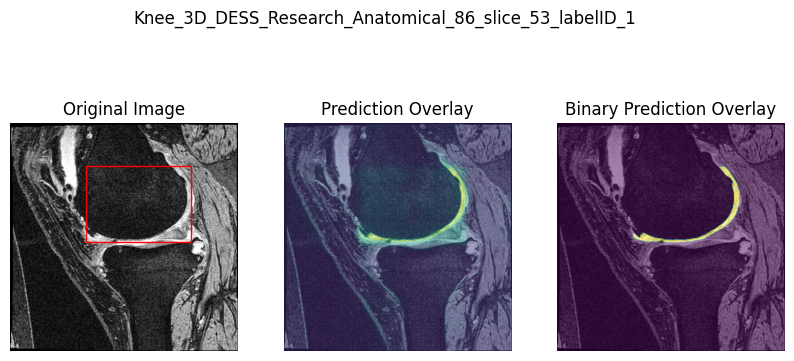

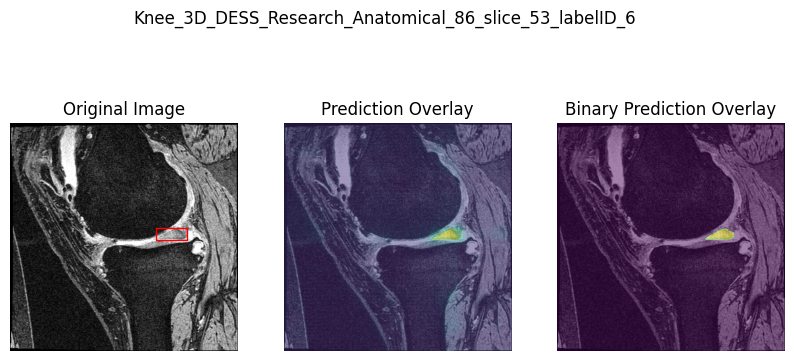

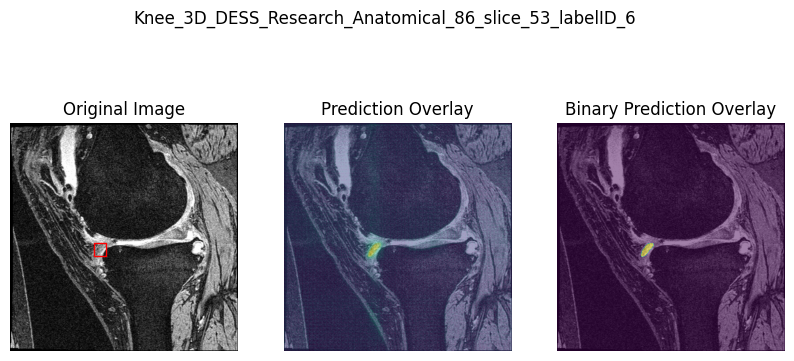

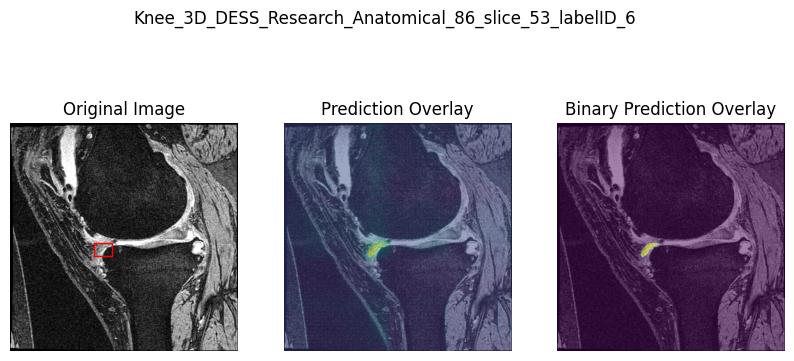

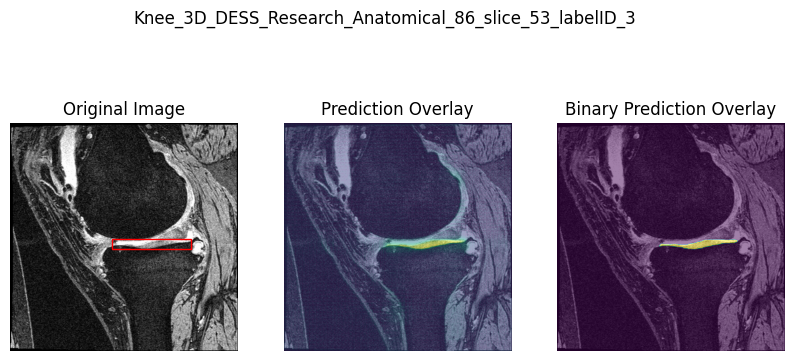

...

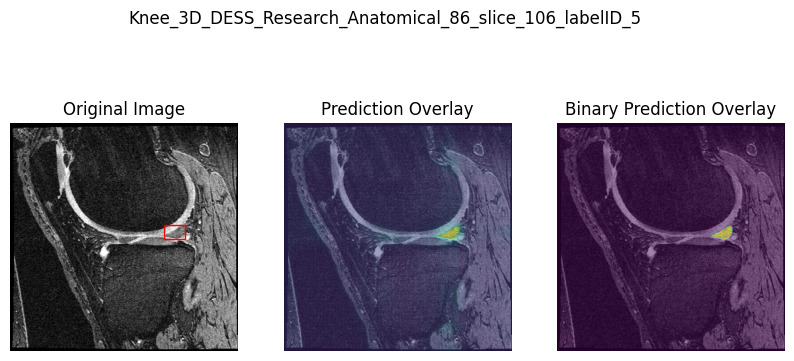

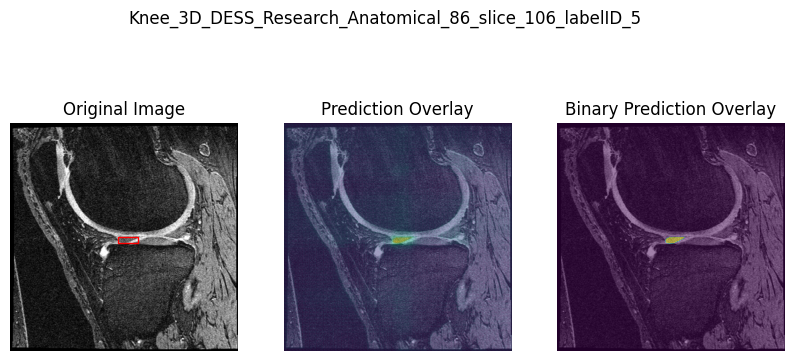

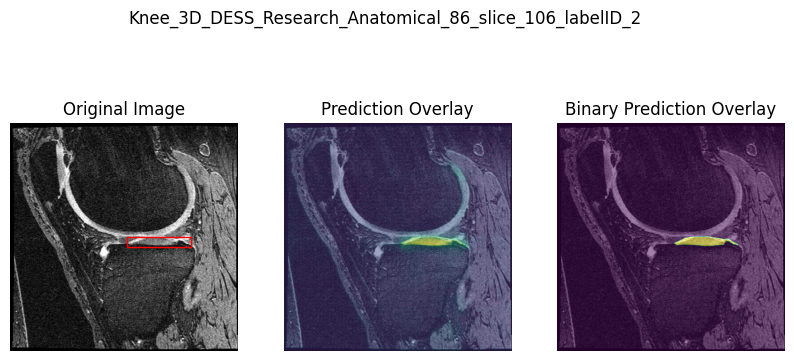

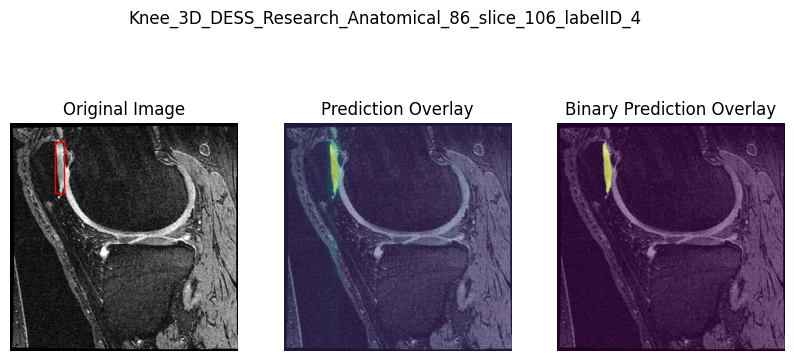

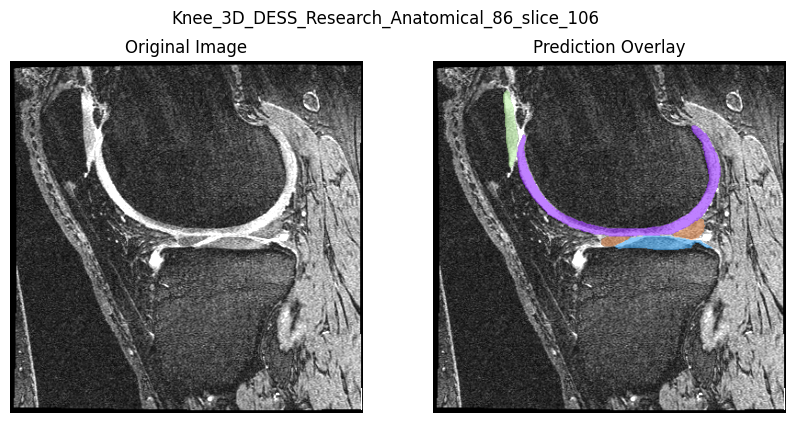

returning fig from plot_segmentation_overlay


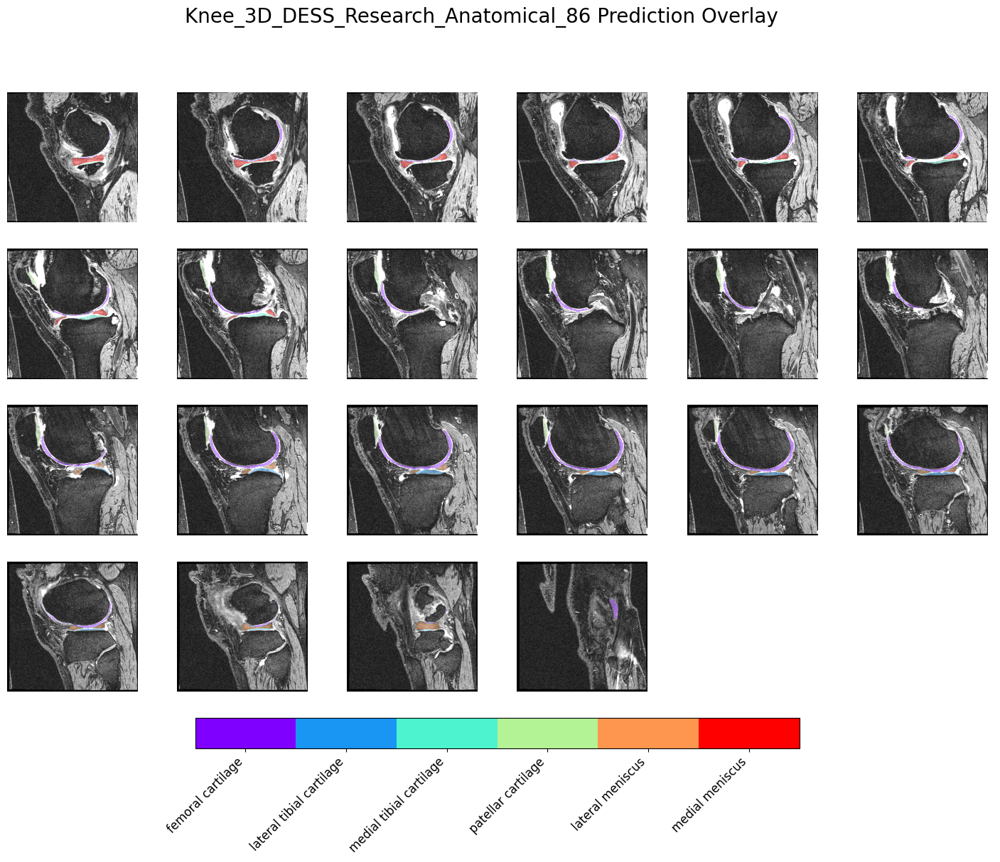

100%|██████████| 1/1 [01:33<00:00, 93.94s/it]


config_file: sam2_hiera_b+.yaml


  0%|          | 0/1 [00:00<?, ?it/s]

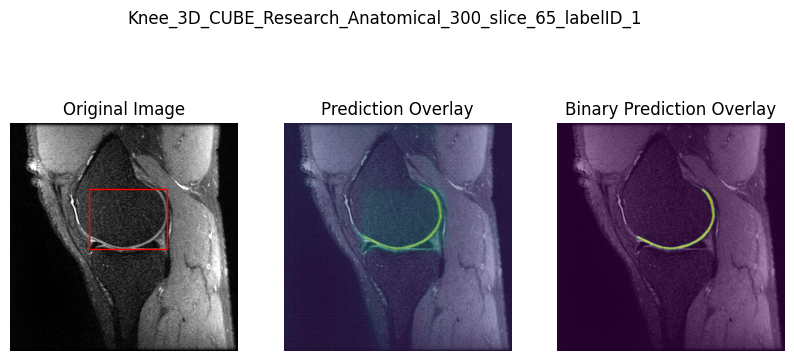

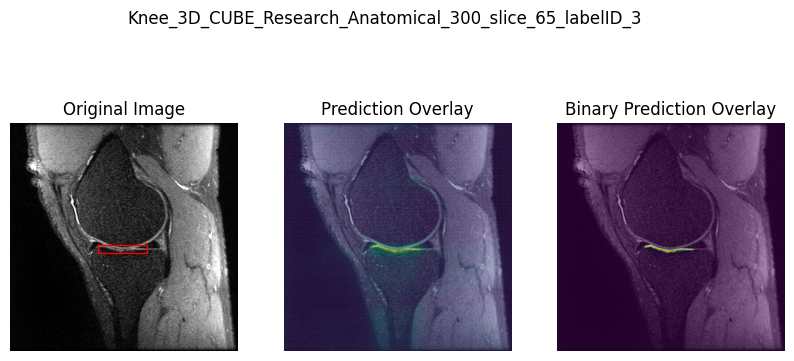

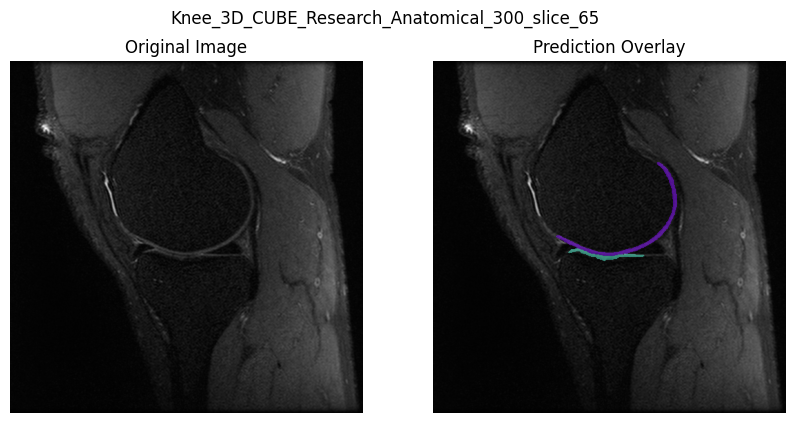

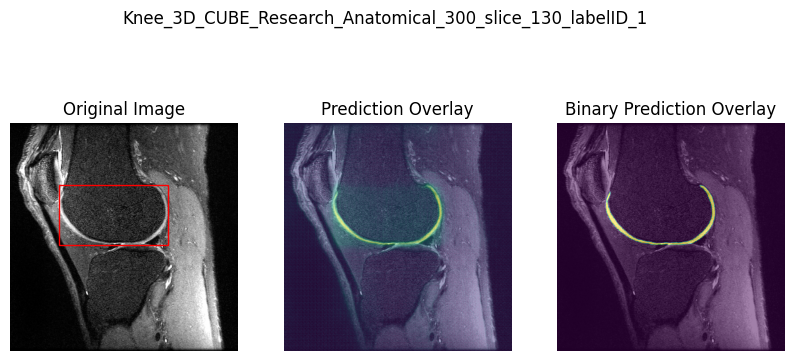

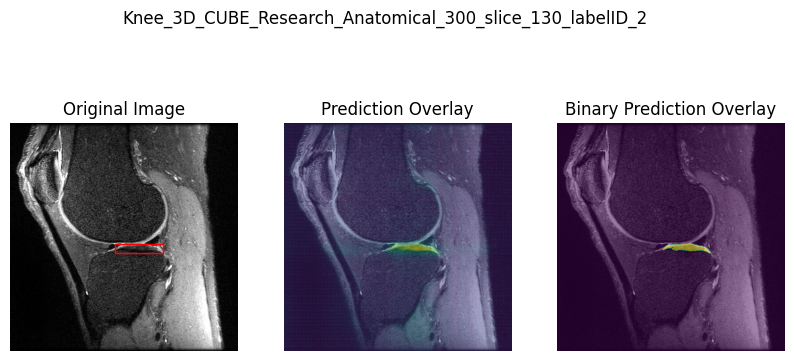

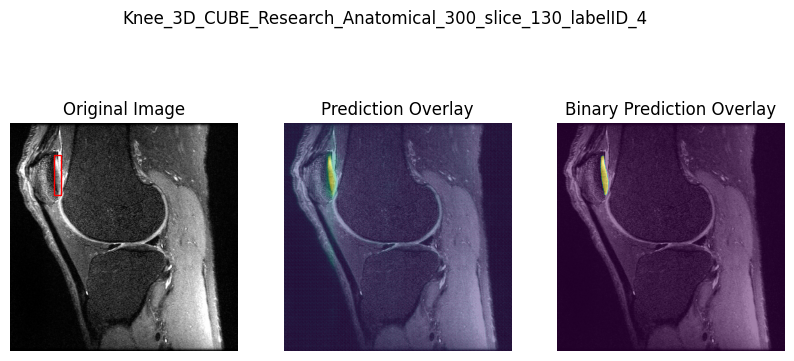

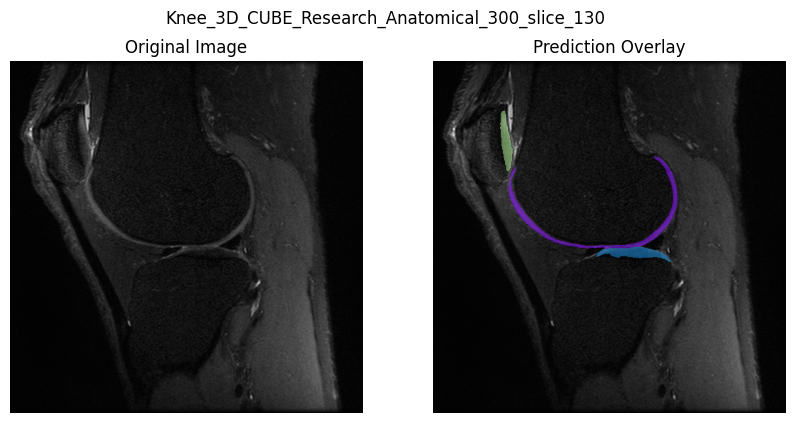

returning fig from plot_segmentation_overlay


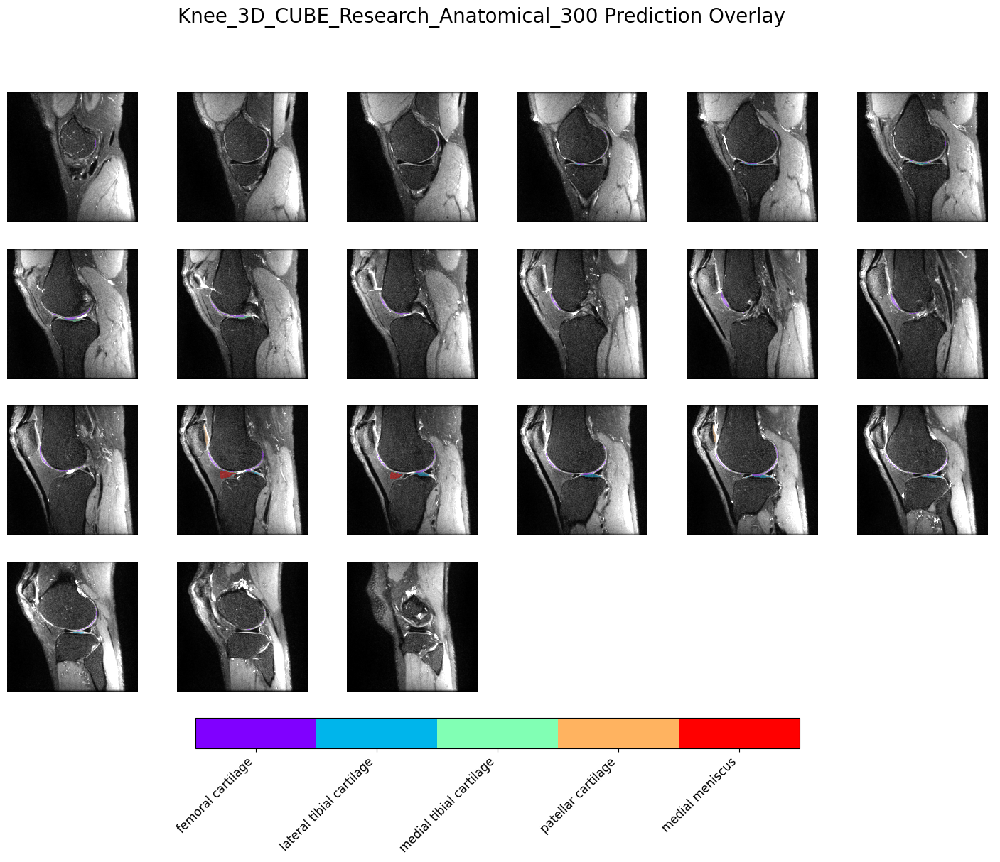

100%|██████████| 1/1 [01:11<00:00, 71.25s/it]


config_file: sam2_hiera_b+.yaml


  0%|          | 0/1 [00:00<?, ?it/s]

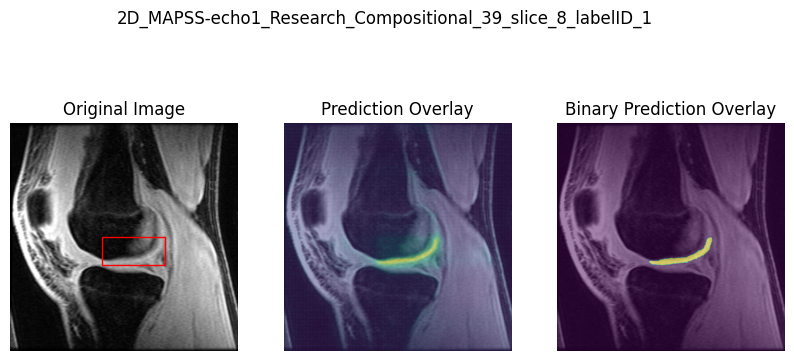

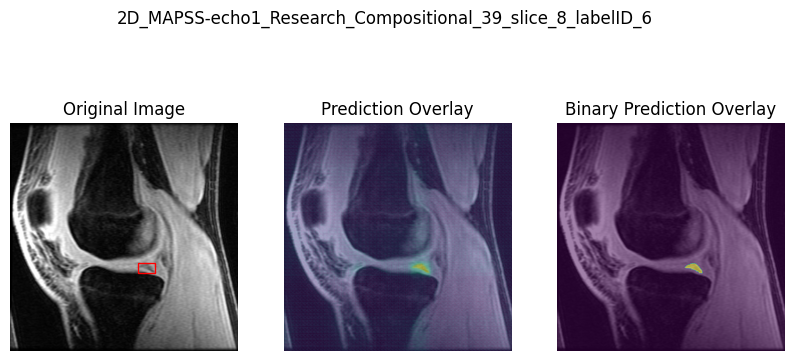

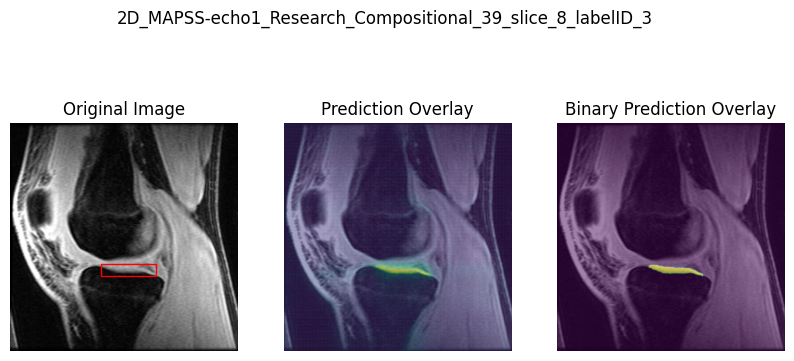

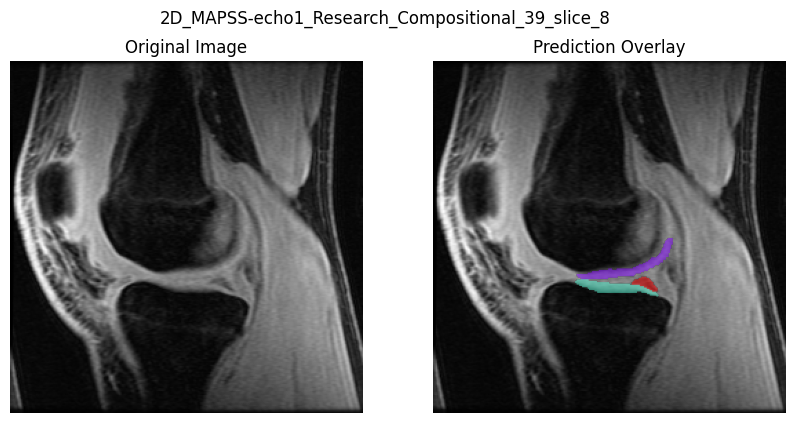

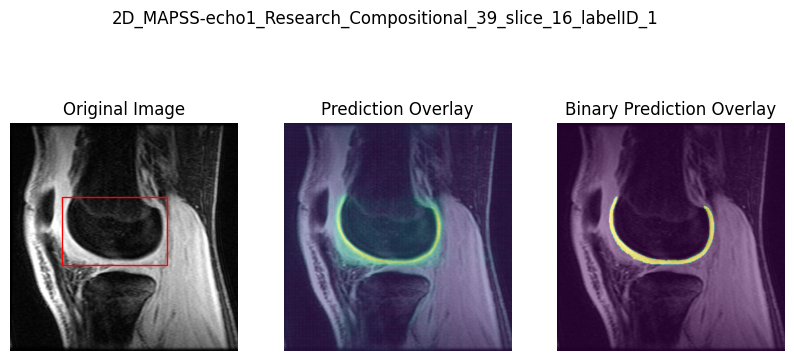

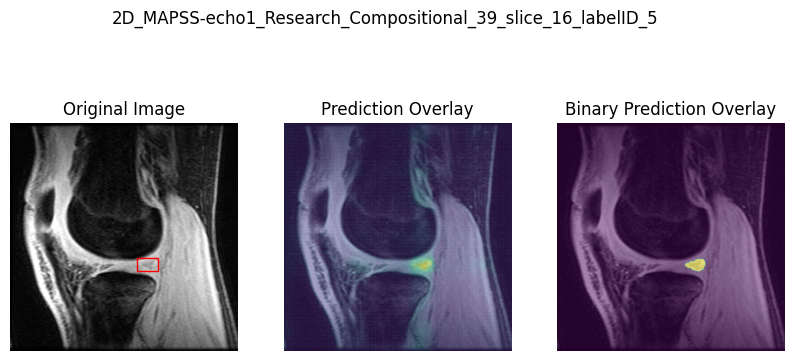

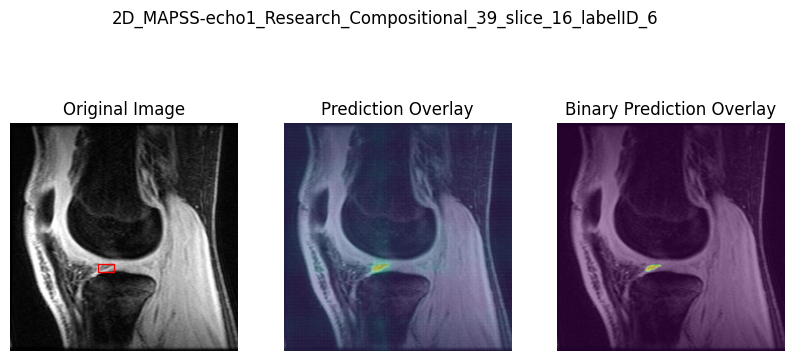

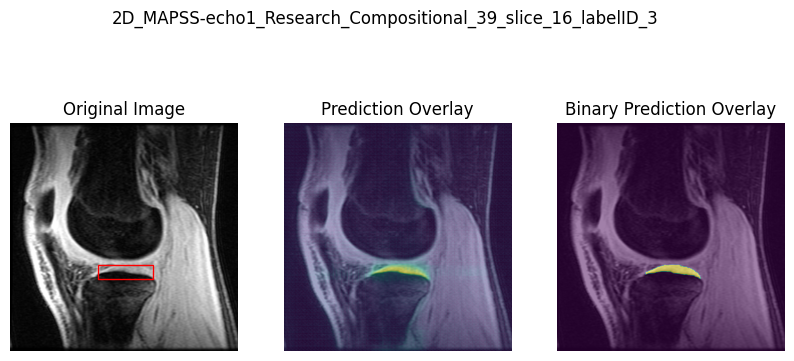

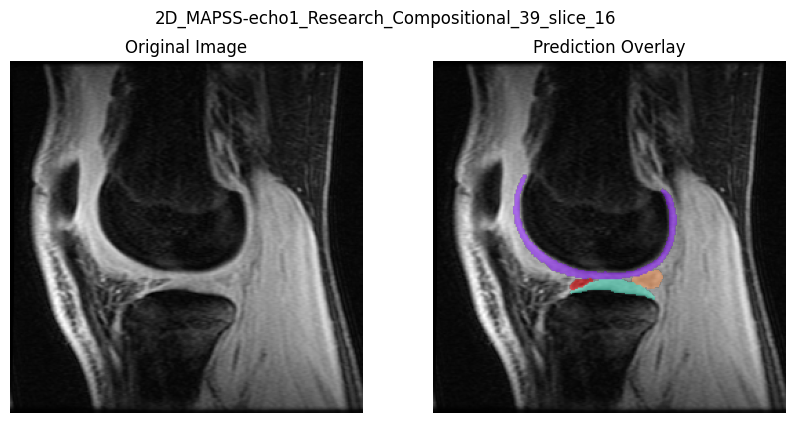

returning fig from plot_segmentation_overlay


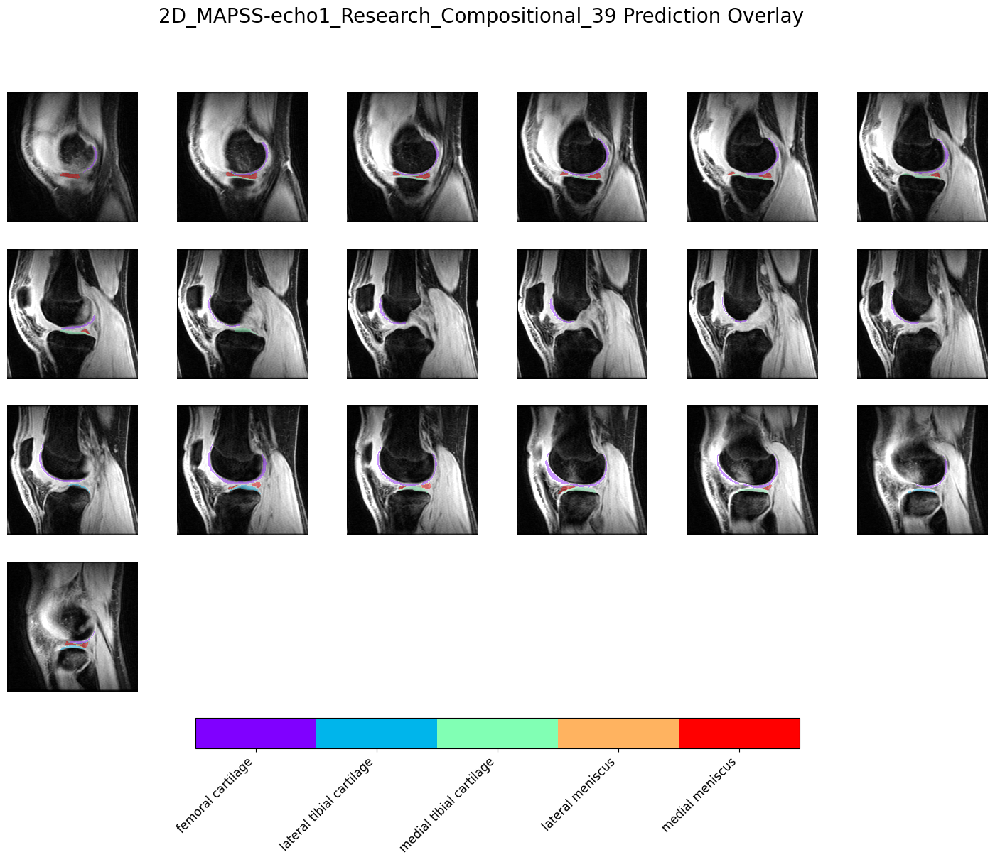

100%|██████████| 1/1 [00:19<00:00, 19.02s/it]


In [4]:
import copy
from src.utils import load_autolabel_config

# Load the original config from disk once.
base_dir = os.getcwd()
config_file = 'Knee.yaml'  # your config file in /config/obj_detection/inference/
original_config = load_autolabel_config(config_file, base_dir)

# Suppose you have a list of cases, each with its own data_dir and img_clim value.
cases = [
    {"data_dir": "../knee_examples/Knee_3D_DESS_Research_Anatomical_86.nii.gz", "img_clim": True},
    {"data_dir": "../knee_examples/Knee_3D_CUBE_Research_Anatomical_300.nii.gz", "img_clim": False},
    {"data_dir": "../knee_examples/2D_MAPSS-echo1_Research_Compositional_39.nii.gz", "img_clim": False},
]

for case in cases:
    # Create a deep copy of the original config.
    config_copy = copy.deepcopy(original_config)
    
    # Modify the necessary fields.
    config_copy["data"]["data_dir"] = case["data_dir"]
    config_copy["output_cfg"]["img_clim"] = case["img_clim"]
    
    # Optionally, you might also update other fields as needed.
    # For example, you might update the task name to reflect the case:
    config_copy["output_cfg"]["task_name"] = f"Knee_{os.path.basename(case['data_dir'])}"
    
    # Now, run your autolabel process with the modified config.
    # autolabel.system_setup(config_copy, callback=notebook_callback, final_callback=final_callback)
    run_autolabel(config_copy, interactive=True, callback=notebook_callback, final_callback=final_callback)
